In [1]:
import numpy as np
import os
import h5py
import matplotlib.pyplot as plt
from astropy.io import fits
import scipy as sp
import paperfig as pf # https://github.com/ajshajib/paperfig

## load data

/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/2961513218.py:6: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(large_image), origin='lower', cmap=pf.cmap,


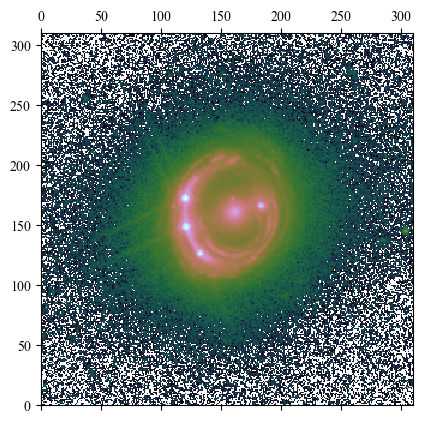

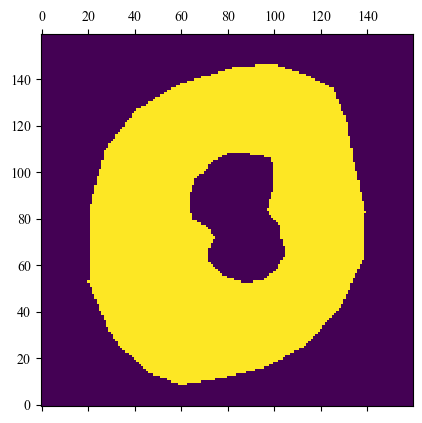

In [2]:
full_image, header = fits.getdata('./data_products/hst_imaging_and_lens_model_products/RXJ1131_F814W_drz_sci.fits', header=True)
small_image = fits.getdata('./data_products/hst_imaging_and_lens_model_products/RXJ1131_F814W_cutout_sci.fits', header=False)
arc_mask = fits.getdata('./data_products/hst_imaging_and_lens_model_products/mask_arc2.fits', header=False)

large_image = full_image[2220:2530, 1720:2030]
plt.matshow(np.log10(large_image), origin='lower', cmap=pf.cmap, 
           vmax=np.log10(np.abs(large_image)).max(), vmin=-3.)
plt.show()

plt.matshow(arc_mask, origin='lower')

In [3]:
arc_subtracted_image, _ = fits.getdata('./data_products/hst_imaging_and_lens_model_products/output_RXJ1131_Mcmc126_image_no-arc_no-qso.fits', header=True)

/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/3679307530.py:3: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(arc_subtracted_image), origin='lower')


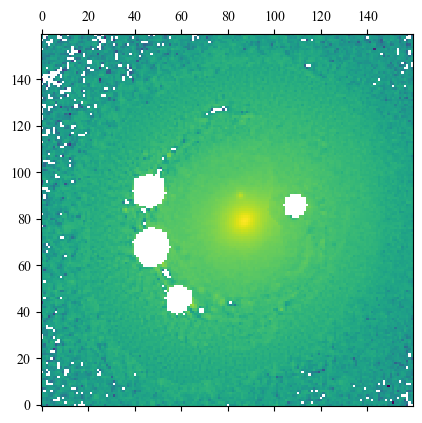

In [4]:
%matplotlib inline

plt.matshow(np.log10(arc_subtracted_image), origin='lower')

/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/4029536198.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(full_image))
/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/4029536198.py:1: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(full_image))


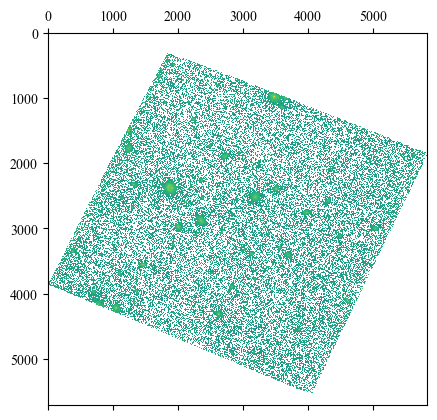

In [5]:
plt.matshow(np.log10(full_image))

In [6]:
header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 5829                                                  
NAXIS2  =                 5714                                                  
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
IRAF-TLM= '14:20:50 (12/06/2008)' / Time of last modification                   
NEXTEND =                    0 / Number of standard extensions                  
DATE    = '2008-06-05T23:27:35' / date this file was written (yyyy-mm-dd)       
FILENAME= 'RXJ1131_F814W_drz_sci.fits' / name of file                           
FILETYPE= 'SCI      '          / type of data found in data file                
                                                                                
TELESCOP= 'HST'             

[81, 74]


/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/556245076.py:25: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(np.abs(_image)), origin='lower')


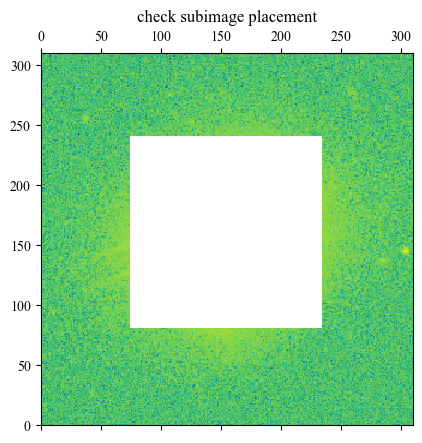

[81, 74]


In [7]:
## find small cutout position


import copy

difference = None
match = [40, 40]

small_size = small_image.shape[0]

for i in range(40, 90):
    for j in range(40, 90):
        diff = np.sum(np.abs(large_image[i:i+small_size, j:j+small_size] - small_image))
#         print(i, j, diff)
        if difference is None:
            difference = diff
        elif diff < difference:
            match = [i, j]
            difference = diff
        
print(match)
_image = copy.deepcopy(large_image)
_image[match[0]:match[0]+small_size, match[1]:match[1]+small_size] -= small_image

plt.matshow(np.log10(np.abs(_image)), origin='lower')
plt.title('check subimage placement')
plt.show()

print(match)

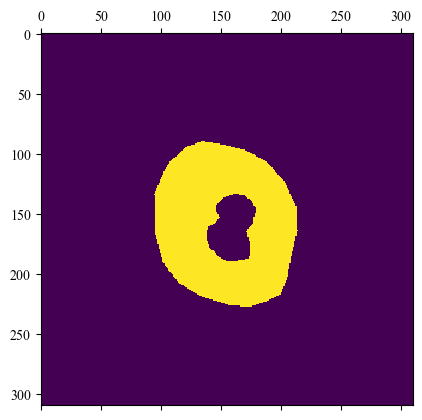

In [8]:
big_mask = np.zeros_like(large_image)
big_mask[match[0]:match[0]+small_size, match[1]:match[1]+small_size] = arc_mask

plt.matshow(big_mask)

## compute background RMS

Text(0.5, 1.0, 'Segmentation Image')

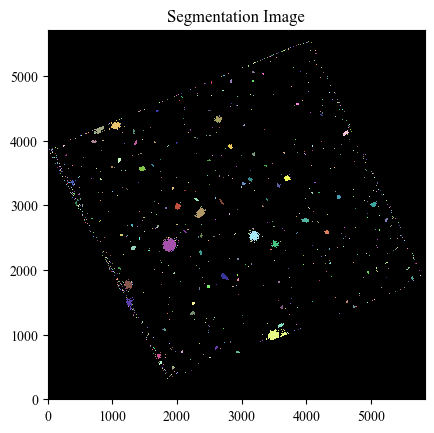

In [9]:
from astropy.stats import sigma_clipped_stats, SigmaClip
from photutils.segmentation import detect_threshold, detect_sources
from photutils.utils import circular_footprint

sigma_clip = SigmaClip(sigma=3.0, maxiters=10)
threshold = detect_threshold(full_image, nsigma=3.0, sigma_clip=sigma_clip)
segment_img = detect_sources(full_image, threshold, npixels=10)

ax = plt.figure().add_subplot(111)

ax.imshow(segment_img, origin='lower', cmap=segment_img.cmap,
           interpolation='nearest')
ax.set_title('Segmentation Image')

# footprint = circular_footprint(radius=10)
# mask = segment_img.make_source_mask(footprint=footprint)
# mean, median, std = sigma_clipped_stats(full_image, sigma=3.0, mask=mask)

# print((mean, median, std)) 

In [10]:
footprint = circular_footprint(radius=50)
mask = segment_img.make_source_mask(footprint=footprint)
mean, median, std = sigma_clipped_stats(full_image[2000:3000, 2000:3000], sigma=3.0, mask=mask[2000:3000, 2000:3000])

print((mean, median, std)) 

(-0.0012216951, -0.0012699945, 0.007430722)


/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/3865155013.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(full_image[2000:3000, 2000:3000]*(1-mask[2000:3000, 2000:3000])))
/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/3865155013.py:1: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(full_image[2000:3000, 2000:3000]*(1-mask[2000:3000, 2000:3000])))


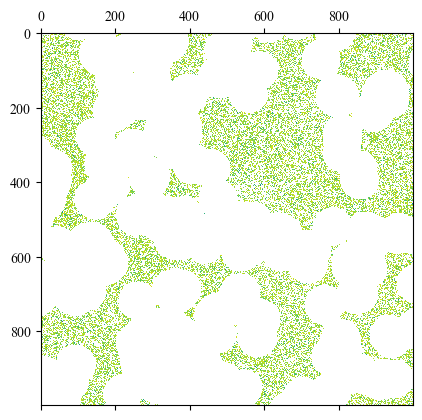

In [11]:
plt.matshow(np.log10(full_image[2000:3000, 2000:3000]*(1-mask[2000:3000, 2000:3000])))

In [12]:
background_rms = std

## functions for manipulating mask

In [13]:
def set_inner_val(arr, x0, y0, r, val):
    """
    """
    x, y = np.meshgrid(np.arange(len(arr)), np.arange(len(arr)))
    rs = np.sqrt((x-x0)**2 + (y-y0)**2)
    
    arr[rs < r] = val
    
    return arr


def set_outer_val(arr, x0, y0, r, val):
    """
    """
    x, y = np.meshgrid(np.arange(len(arr)), np.arange(len(arr)))
    rs = np.sqrt((x-x0)**2 + (y-y0)**2)
    
    arr[rs > r] = val
    
    return arr

In [14]:
from scipy.stats import norm


def mask_residual_pixels(residual, _mask, sigma=3):
    """
    Mask a random subset of the pixels above `sigma` threshold so that the Gaussian
    tail is preserved.
    :param sigma: sigma threshold above which to mask pixels
    """
    threshold = 100 * (1 - 2 * norm.cdf(-sigma))
    num_total_pixels = np.sum(_mask)

    num_crossed_pixels = np.sum(residual[_mask == 1] > sigma) + np.sum(residual[_mask == 1] < -sigma)
    num_good_pixels = num_total_pixels - num_crossed_pixels
    num_pixels_to_mask = num_crossed_pixels - int(np.round(num_good_pixels * (100. - threshold) / threshold))

    _new_mask = np.ones_like(_mask)
    _new_mask[residual*_mask > sigma] = 0
    _new_mask[residual*_mask < -sigma] = 0

    _new_mask[_mask == 0] = 1

    bad_pixel_indices = np.argwhere(_new_mask == 0)

    pixels_to_switch = np.random.randint(low=0, high=num_crossed_pixels, 
                                         size=(num_crossed_pixels-num_pixels_to_mask))

    for p in pixels_to_switch:
        x, y = bad_pixel_indices[p]
        _new_mask[x, y] = 1

    _new_mask[_mask == 0] = 0
    
    return _new_mask

/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/930303812.py:10: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(large_image * test_mask), cmap='cubehelix', origin='lower')


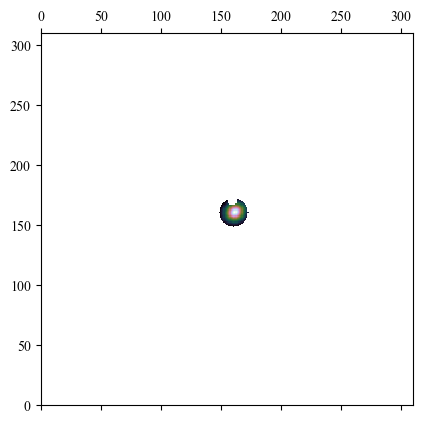

In [15]:
# test the functions defined above

test_mask = np.ones_like(large_image)

test_mask = set_outer_val(test_mask, 160, 160, 12, 0)
test_mask = set_inner_val(test_mask, 159, 170, 4, 0)
# mask = set_outer_val(mask, 152, 152, 70, 1)
# mask = set_outer_val(mask, 160, 160, 135, 0)

plt.matshow(np.log10(large_image * test_mask), cmap='cubehelix', origin='lower')

## prepare data and psf dictionaries

/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/132956570.py:5: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(_image), origin='lower')


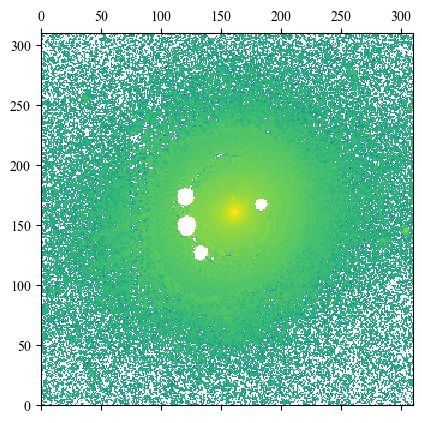

In [16]:
_image = copy.deepcopy(large_image)

_image[match[0]:match[0]+small_size, match[1]:match[1]+small_size] = arc_subtracted_image

plt.matshow(np.log10(_image), origin='lower')

[[40 40]] (81, 81)


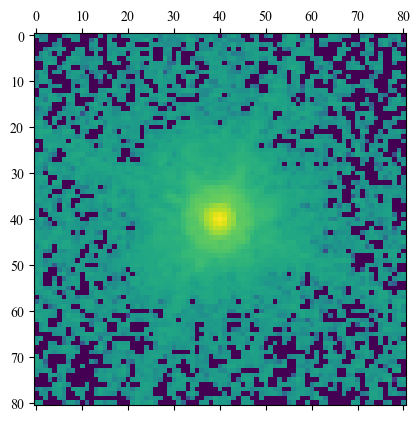

In [17]:
kwargs_data = {'image_data': _image, 
               'background_rms': background_rms,
               'noise_map': None,
               'exposure_time': np.ones_like(large_image)*header['EXPTIME'],
               'ra_at_xy_0': -large_image.shape[0]/2.*header['CD1_1']*3600,
               'dec_at_xy_0': -large_image.shape[0]/2.*header['CD2_2']*3600, 
               'transform_pix2angle': np.array([[header['CD1_1']*3600, header['CD1_2']*3600], 
                                                [header['CD2_1']*3600, header['CD2_2']*3600]])
               }

psf = fits.getdata('./data_products/hst_imaging_and_lens_model_products/psf_rxj1131_f814w_forAnowar.fits')

psf[psf < 0] = 1e-10
psf = psf[40:-40, 40:-40]
psf /= np.sum(psf)

print(np.argwhere(psf == np.max(psf)), psf.shape)

plt.matshow(np.log10(psf))
plt.show()

kwargs_psf = {'psf_type': "PIXEL", 
             'kernel_point_source': psf ,
             'kernel_point_source_init': psf,
             'psf_error_map': None
             }

## Make initial mask

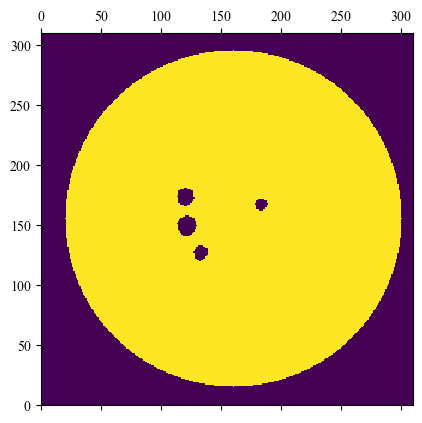

In [18]:
mask = np.ones_like(_image)
mask[_image == -99] = 0.

mask = set_outer_val(mask, 160, 155, 140, 0)

plt.matshow(mask, origin='lower')

## iteratively update mask

In [19]:
from lenstronomy.Plots.model_plot import ModelPlot

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-2.978937857445425 reduced X^2 of best position
-90787.5996124355 log likelihood
60953.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.3059721769060105, 'n_sersic': 1.5266713574804134, 'e1': 0.023583038356185842, 'e2': -0.06655838439701263, 'center_x': -0.3110795295537826, 'center_y': 0.265151366482882}, {'amp': 1, 'R_sersic': 2.3638342720894308, 'n_sersic': 0.9402620247362643, 'e1': 0.04288811243131636, 'e2': -0.07079079346135707, 'center_x': -0.3110795295537826, 'center_y': 0.265151366482882}] lens light result
[] point source result
{} special param result
126.24448823928833 time used for  PSO
-2.9783515004489627 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  2.9783515004489627


/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: divide by zero encountered in log10
  log_model = np.log10(model)
/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


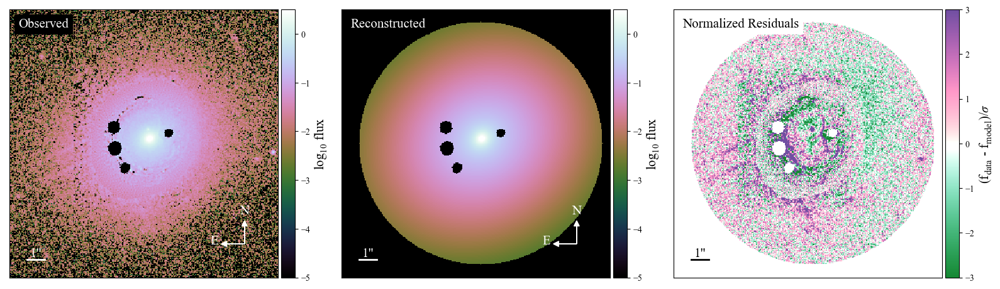

/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:533: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data - model), origin='lower', vmin=v_min, vmax=v_max,


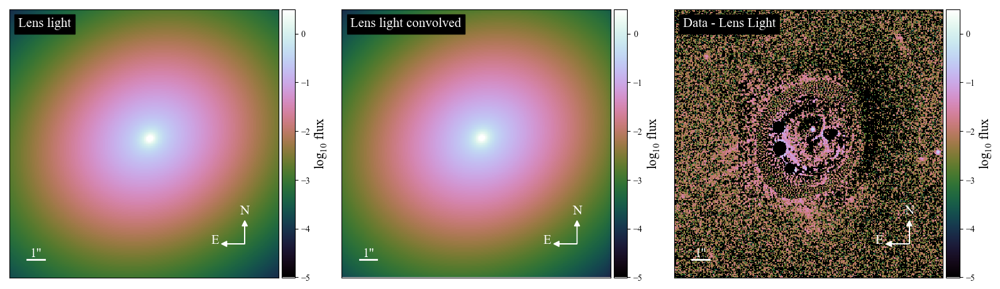

In [20]:
from fit_light_utils import *


kwargs_result, multi_band_list, kwargs_model, _ = fit_galaxy_light(kwargs_data, kwargs_psf, mask, 0, 0, 1., 
                                                                   #fix_params=kwargs_init, 
                                                                   plot=True)

-2.9783515004489627 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  2.9783515004489627


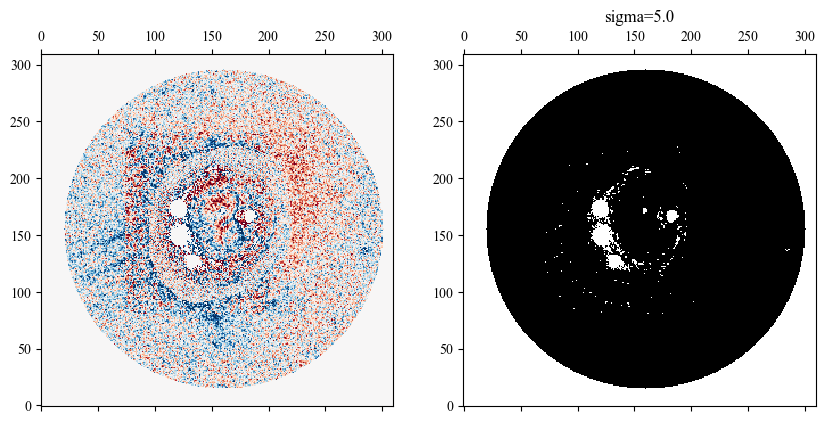

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.690706286512747 reduced X^2 of best position
-50967.18636007001 log likelihood
60291.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.28716931738621115, 'n_sersic': 1.5304883466668247, 'e1': 0.0387847753751013, 'e2': -0.06843041420332653, 'center_x': -0.3116495184091082, 'center_y': 0.26393719427315926}, {'amp': 1, 'R_sersic': 2.423418167871343, 'n_sersic': 1.1096537095728167, 'e1': 0.03806382847156407, 'e2': -0.06710070407567109, 'center_x': -0.3116495184091082, 'center_y': 0.26393719427315926}] lens light result
[] point source result
{} special param result
125.75452589988708 time used for  PSO
-1.6903698442886759 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.6903698442886756


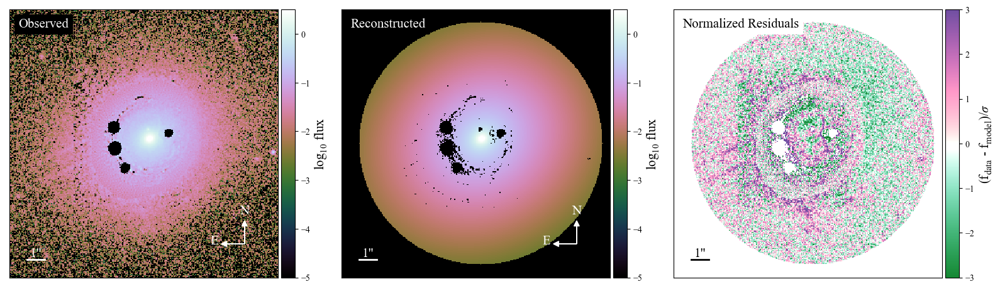

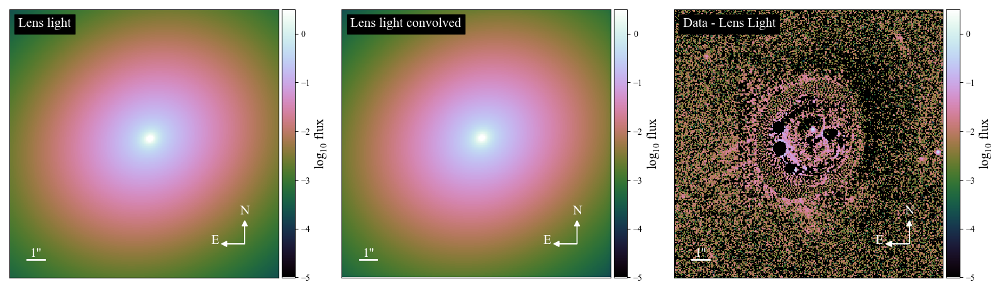

-1.6903698442886759 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.6903698442886756


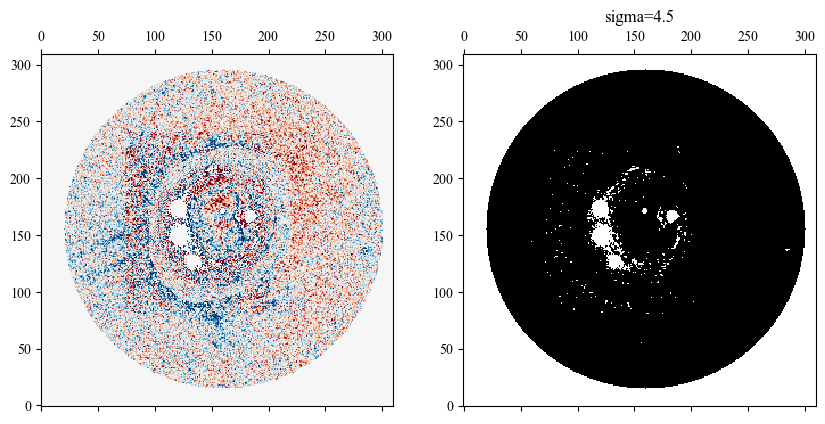

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.624342368057429 reduced X^2 of best position
-48808.23947538962 log likelihood
60096.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.2830441034478685, 'n_sersic': 1.5029384074682621, 'e1': 0.04207145997460747, 'e2': -0.06920646753527862, 'center_x': -0.3120226294989776, 'center_y': 0.26337355956722336}, {'amp': 1, 'R_sersic': 2.4239303368871816, 'n_sersic': 1.1299341377417373, 'e1': 0.036875467523841916, 'e2': -0.06636776782918775, 'center_x': -0.3120226294989776, 'center_y': 0.26337355956722336}] lens light result
[] point source result
{} special param result
104.3742561340332 time used for  PSO
-1.6240180832963873 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.6240180832963873


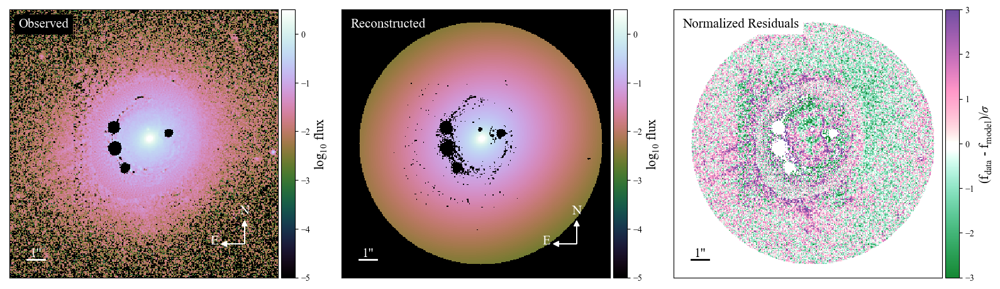

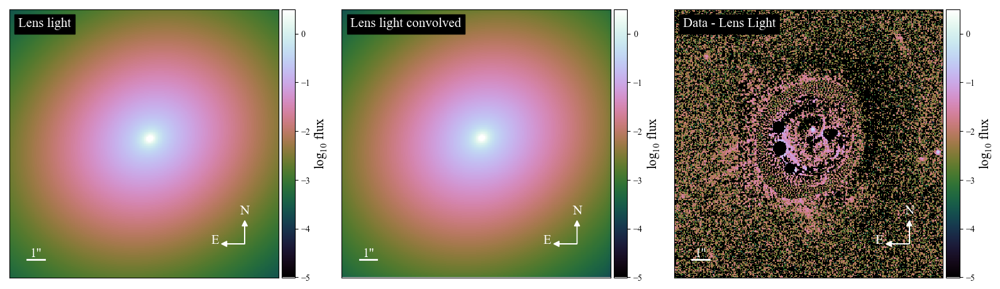

-1.6240180832963873 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.6240180832963873


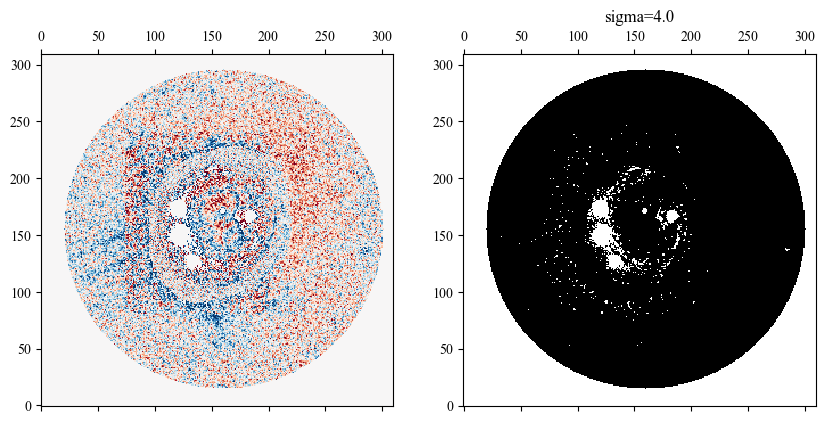

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.5440499367360618 reduced X^2 of best position
-46167.86513337662 log likelihood
59801.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.2885647961559515, 'n_sersic': 1.538296429558824, 'e1': 0.042096939427139844, 'e2': -0.06870927856448189, 'center_x': -0.31216528536947075, 'center_y': 0.2638135891508472}, {'amp': 1, 'R_sersic': 2.429419364683969, 'n_sersic': 1.1162272423667796, 'e1': 0.03673960575888626, 'e2': -0.06589685986286846, 'center_x': -0.31216528536947075, 'center_y': 0.2638135891508472}] lens light result
[] point source result
{} special param result
109.2514979839325 time used for  PSO
-1.5437401612818824 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.543740161281882


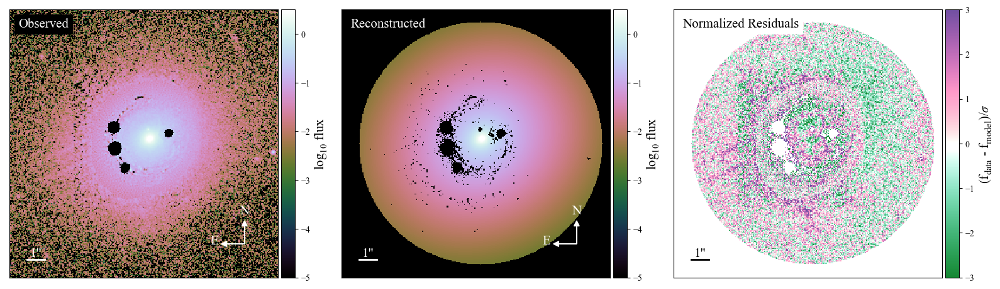

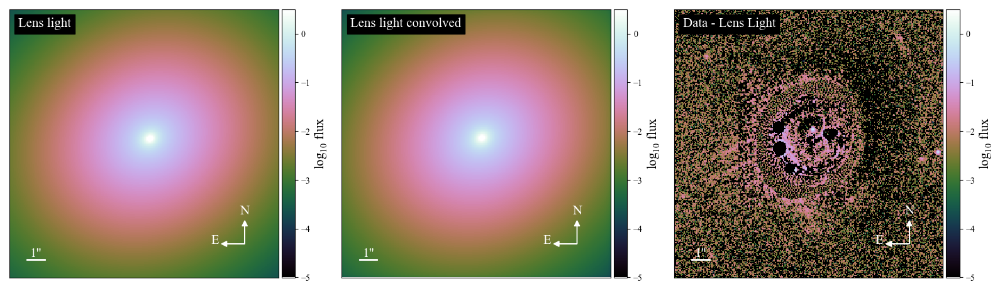

-1.5437401612818824 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.543740161281882


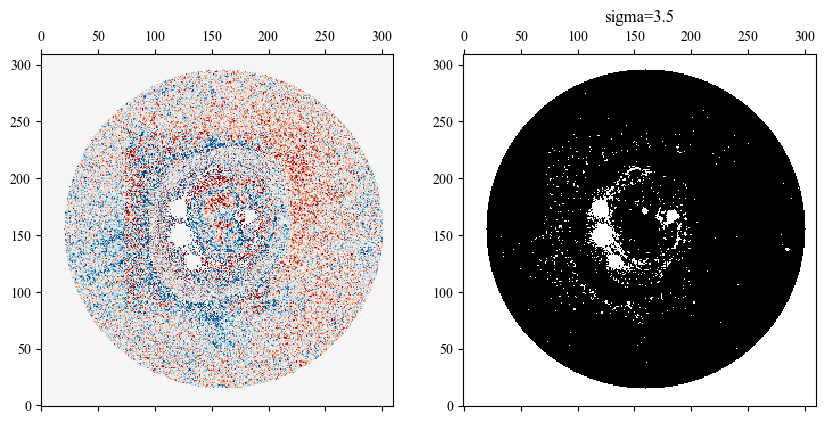

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.4586133170449784 reduced X^2 of best position
-43240.59178379839 log likelihood
59290.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.45610465024568625, 'n_sersic': 2.28419330266094, 'e1': 0.050803875663723165, 'e2': -0.06914054128451277, 'center_x': -0.3133230310877236, 'center_y': 0.2651171575586307}, {'amp': 1, 'R_sersic': 2.6184220916975747, 'n_sersic': 0.8258861612340898, 'e1': 0.030388825586152916, 'e2': -0.06251655413193342, 'center_x': -0.3133230310877236, 'center_y': 0.2651171575586307}] lens light result
[] point source result
{} special param result
105.24879002571106 time used for  PSO
-1.4583181607297693 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.4583181607297693


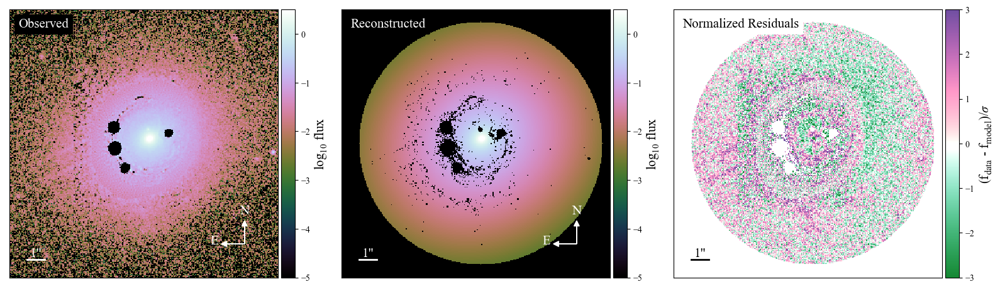

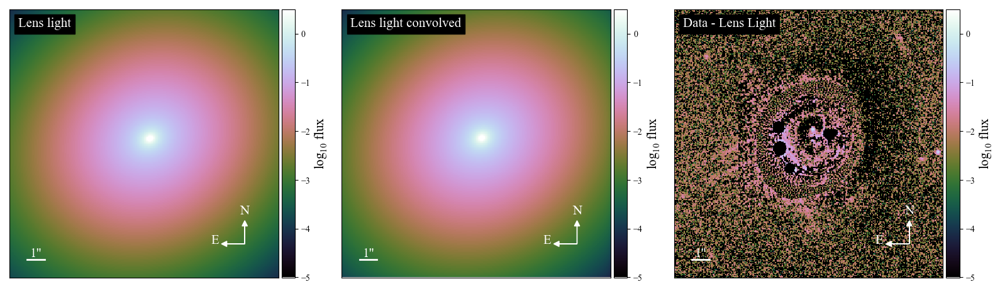

-1.4583181607297693 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.4583181607297693


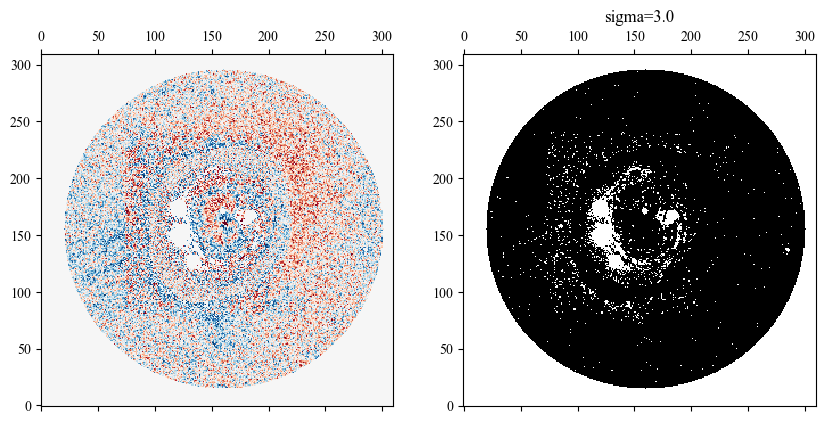

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.3127369492098286 reduced X^2 of best position
-38369.98828845408 log likelihood
58458.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.30101628099178623, 'n_sersic': 1.6035087419815282, 'e1': 0.044984478851057615, 'e2': -0.07031382334645678, 'center_x': -0.31298231602027676, 'center_y': 0.2642178698620601}, {'amp': 1, 'R_sersic': 2.444467663622891, 'n_sersic': 1.0939597657097813, 'e1': 0.03459551820515112, 'e2': -0.06386542136844628, 'center_x': -0.31298231602027676, 'center_y': 0.2642178698620601}] lens light result
[] point source result
{} special param result
122.53412985801697 time used for  PSO
-1.312467531672792 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.312467531672792


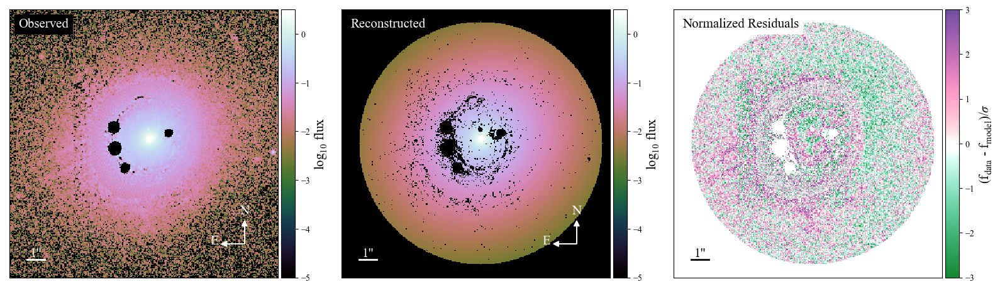

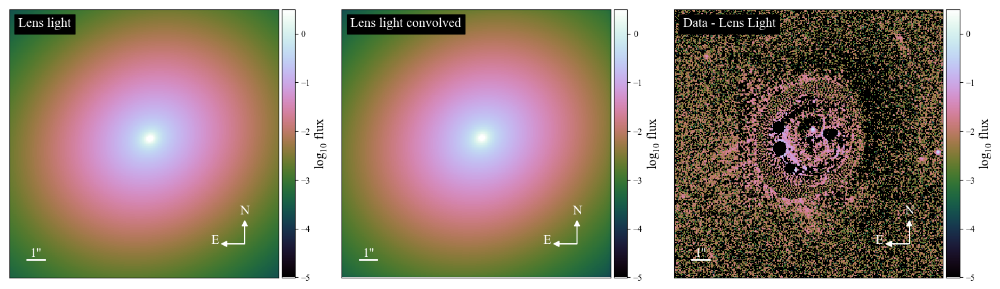

-1.312467531672792 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.312467531672792


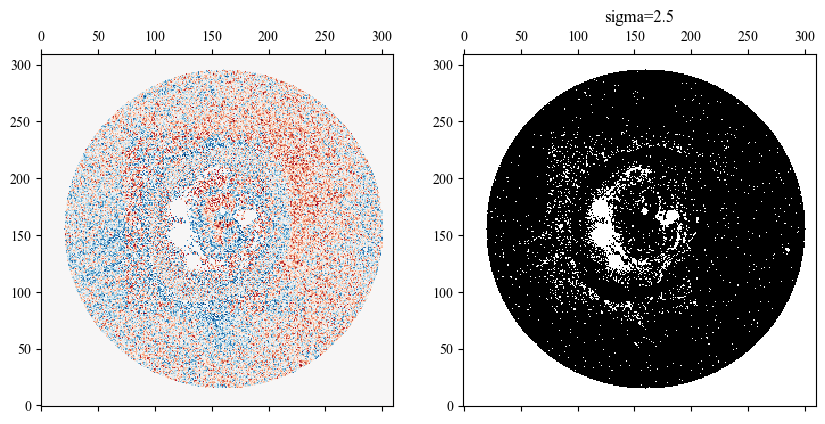

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.1759193068841478 reduced X^2 of best position
-33647.755047183 log likelihood
57228.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.3020651724723563, 'n_sersic': 1.6223347381225242, 'e1': 0.04591259045931793, 'e2': -0.07008732665579795, 'center_x': -0.31290092375688944, 'center_y': 0.26476103592935707}, {'amp': 1, 'R_sersic': 2.4434760077168995, 'n_sersic': 1.091430244665302, 'e1': 0.03534174990636198, 'e2': -0.06271723164794091, 'center_x': -0.31290092375688944, 'center_y': 0.26476103592935707}] lens light result
[] point source result
{} special param result
112.61828017234802 time used for  PSO
-1.1756727829204403 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.17567278292044


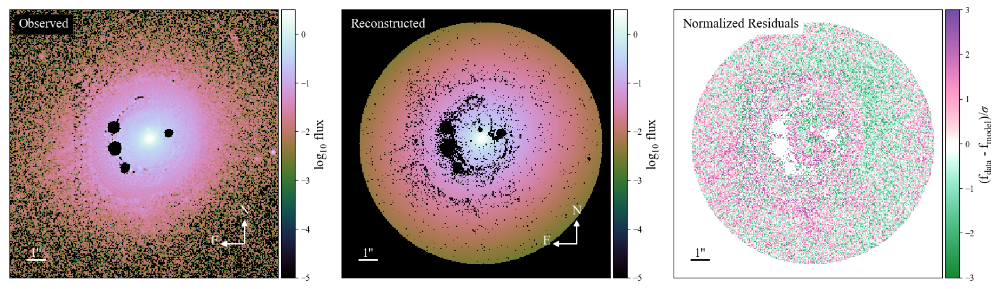

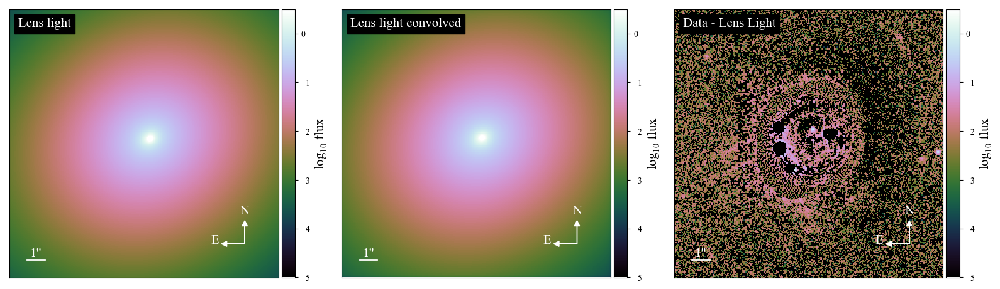

-1.1756727829204403 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.17567278292044


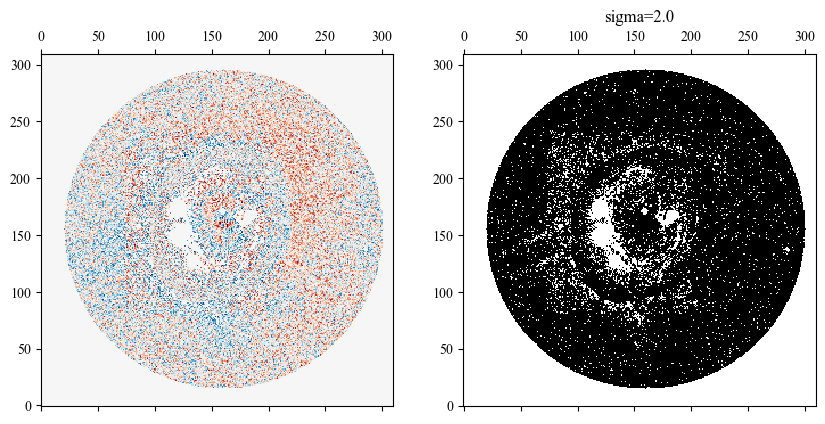

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.0164237448535702 reduced X^2 of best position
-28018.736950633516 log likelihood
55132.0 effective number of data points
[] lens result
[] source result
[{'amp': 1, 'R_sersic': 0.29828967153494024, 'n_sersic': 1.5979117238008613, 'e1': 0.04218722842898208, 'e2': -0.07099076636572588, 'center_x': -0.31266862070685336, 'center_y': 0.2647892515479737}, {'amp': 1, 'R_sersic': 2.4387122259414387, 'n_sersic': 1.1032553014603685, 'e1': 0.03506597485937194, 'e2': -0.062307986158970055, 'center_x': -0.31266862070685336, 'center_y': 0.2647892515479737}] lens light result
[] point source result
{} special param result
118.88193917274475 time used for  PSO
-1.0162025587782357 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.0162025587782357


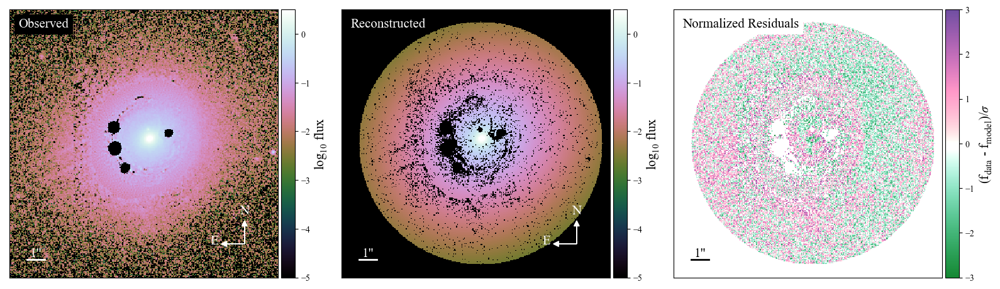

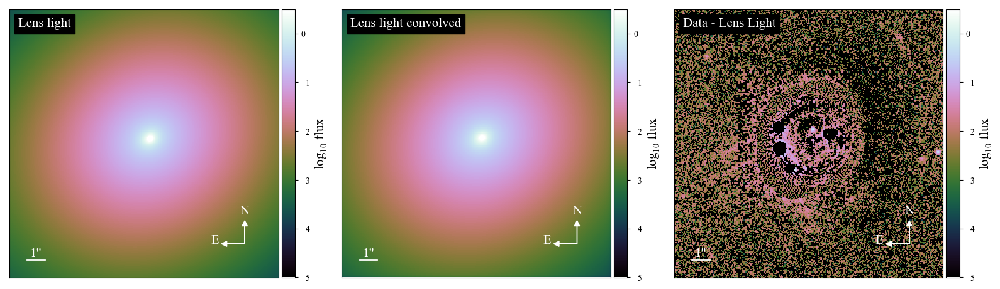

In [21]:
new_mask = np.copy(mask)

for sigma_threshold in np.arange(5, 1.9, -0.5):    
    model_plot_1 = ModelPlot(multi_band_list, kwargs_model, kwargs_result,
                            arrow_size=0.02, #cmap_string=cmap,
                            image_likelihood_mask_list=[new_mask], #kwargs_likelihood['image_likelihood_mask_list'],
                            multi_band_type='multi-linear')

    new_mask = mask_residual_pixels(model_plot_1._band_plot_list[0]._norm_residuals, new_mask, 
                                    sigma=sigma_threshold)
    
    new_mask = set_inner_val(new_mask, 160, 160, 8, 1)
    
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(121)
    ax.matshow(model_plot_1._band_plot_list[0]._norm_residuals*new_mask, 
               cmap='RdBu_r', vmax=3, vmin=-3, origin='lower');
    ax = fig.add_subplot(122)
    ax.matshow(new_mask, cmap='Greys', origin='lower')
    ax.set_title('sigma={}'.format(sigma_threshold))
    plt.show()
    
    # break
    kwargs_result, multi_band_list, kwargs_model, _ = fit_galaxy_light(kwargs_data, kwargs_psf, new_mask, 0, 0, 1., 
                                                                    plot=True)

In [22]:
import lenstronomy.Util.class_creator as class_creator

image_model = class_creator.create_im_sim(multi_band_list, multi_band_type='multi-linear', 
                                          kwargs_model=kwargs_model,
                                          bands_compute=None, 
                                          linear_solver=True,
                                          image_likelihood_mask_list=[new_mask])


kwargs_result_copy = copy.deepcopy(kwargs_result)
model, error_map, cov_param, param = image_model.image_linear_solve(inv_bool=True, **kwargs_result_copy)


In [26]:
kwargs_result_copy['kwargs_lens_light']

[{'amp': 446.31321418794755,
  'R_sersic': 0.29828967153494024,
  'n_sersic': 1.5979117238008613,
  'e1': 0.04218722842898208,
  'e2': -0.07099076636572588,
  'center_x': -0.31266862070685336,
  'center_y': 0.2647892515479737},
 {'amp': 32.351286377495676,
  'R_sersic': 2.4387122259414387,
  'n_sersic': 1.1032553014603685,
  'e1': 0.03506597485937194,
  'e2': -0.062307986158970055,
  'center_x': -0.31266862070685336,
  'center_y': 0.2647892515479737}]

## Final MCMC

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-1.012796240605621 reduced X^2 of best position
-27918.741168534547 log likelihood
55132 effective number of data points
[] lens result
[] source result
[{'amp': 446.30298472613015, 'R_sersic': 0.29742370945415136, 'n_sersic': 1.5875640004788985, 'e1': 0.04258826660477448, 'e2': -0.06983621296998291, 'center_x': -0.3131746736295742, 'center_y': 0.26456264043515887}, {'amp': 32.471564311922904, 'R_sersic': 2.4497853969926564, 'n_sersic': 1.118367591505174, 'e1': 0.03523350790017206, 'e2': -0.06375454933397488, 'center_x': -0.3131746736295742, 'center_y': 0.26456264043515887}] lens light result
[] point source result
{} special param result
80.01032996177673 time used for  PSO


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [25:46<00:00,  1.29it/s]
/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',


Computing the MCMC...
Number of walkers =  96
Burn-in iterations:  0
Sampling iterations (in current run): 2000
1547.1293799877167 time taken for MCMC sampling
-1.0121120743632106 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.0121120743632106


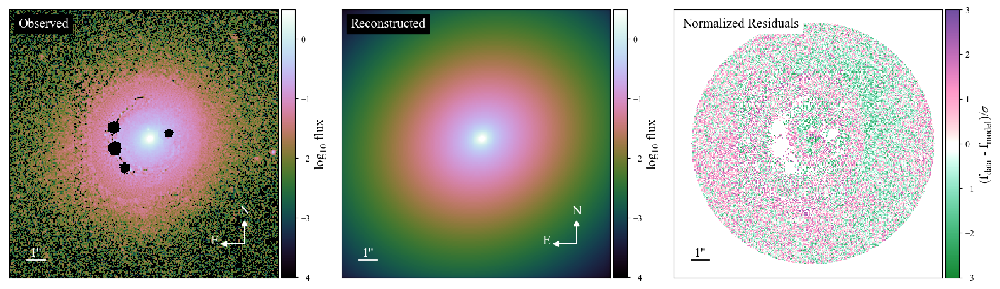

/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:533: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data - model), origin='lower', vmin=v_min, vmax=v_max,


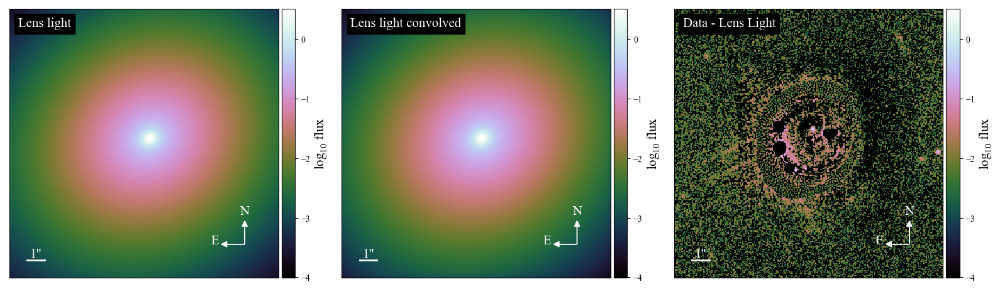

In [27]:
kwargs_result, multi_band_list, kwargs_model, fit_output = fit_galaxy_light(kwargs_data, kwargs_psf, new_mask, 0, 0, 1., 
                                                                   kwargs_light_init=kwargs_result_copy['kwargs_lens_light'],
                                                                   do_mcmc=True, mcmc_steps=2000,
                                                                   linear_solver=False,
                                                                   plot=True)

/var/folders/ry/23z2z0bd7_d814t1jlq8ydlw0000gn/T/ipykernel_3339/1443165349.py:4: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if not samples_mcmc == []:


N_step: 2000, N_walkers: 96, N_params: 12
amp_lens_light0 440.8507 ± 6.8835
R_sersic_lens_light0 0.3001 ± 0.0034
n_sersic_lens_light0 1.6031 ± 0.0163
e1_lens_light0 0.0436 ± 0.0015
e2_lens_light0 -0.0702 ± 0.0013
center_x_lens_light0 -0.3131 ± 0.0003
center_y_lens_light0 0.2647 ± 0.0003
amp_lens_light1 32.8332 ± 0.1405
R_sersic_lens_light1 2.4374 ± 0.0053
n_sersic_lens_light1 1.0961 ± 0.0103
e1_lens_light1 0.0348 ± 0.0008
e2_lens_light1 -0.0632 ± 0.0009


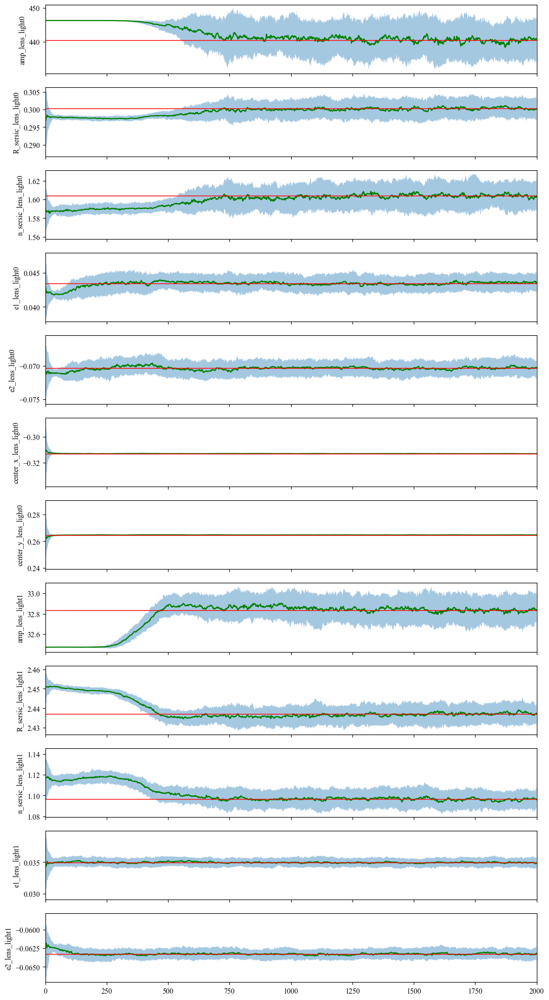

In [33]:
samples_mcmc = fit_output[-1][1]
param_mcmc = fit_output[-1][2]
    
if not samples_mcmc == []:
    n_params = samples_mcmc.shape[1]

    n_walkers = 8 * n_params
    n_step = int(samples_mcmc.shape[0] / n_walkers)

    print('N_step: {}, N_walkers: {}, N_params: {}'.format(n_step, n_walkers, n_params))

    chain = np.empty((n_walkers, n_step, n_params))

    for i in np.arange(n_params):
        samples = samples_mcmc[:, i].T
        chain[:,:,i] = samples.reshape((n_step, n_walkers)).T

    mean_pos = np.zeros((n_params, n_step))
    median_pos = np.zeros((n_params, n_step))
    std_pos = np.zeros((n_params, n_step))
    q16_pos = np.zeros((n_params, n_step))
    q84_pos = np.zeros((n_params, n_step))

    for i in np.arange(n_params):
        for j in np.arange(n_step):
            mean_pos[i][j] = np.mean(chain[:, j, i])
            median_pos[i][j] = np.median(chain[:, j, i])
            std_pos[i][j] = np.std(chain[:, j, i])
            q16_pos[i][j] = np.percentile(chain[:, j, i], 16.)
            q84_pos[i][j] = np.percentile(chain[:, j, i], 84.)

    fig, ax = plt.subplots(n_params, sharex=True, figsize=(8, 6))

    burnin = -750
    last = n_step

    medians = []

    param_values = [median_pos[0][last-1], (q84_pos[0][last-1]-q16_pos[0][last-1])/2,
                    median_pos[1][last-1], (q84_pos[1][last-1]-q16_pos[1][last-1])/2]

    for i in range(n_params):
        print(param_mcmc[i], '{:.4f} ± {:.4f}'.format(median_pos[i][last-1], (q84_pos[i][last-1]-q16_pos[i][last-1])/2))

        ax[i].plot(median_pos[i][:last], c='g')
        ax[i].axhline(np.median(median_pos[i][burnin:last]), c='r', lw=1)
        ax[i].fill_between(np.arange(last), q84_pos[i][:last], q16_pos[i][:last], alpha=0.4)
        ax[i].set_ylabel(param_mcmc[i], fontsize=10)
        ax[i].set_xlim(0, last)

        medians.append(np.median(median_pos[i][burnin:last]))

    if True:
        fig.set_size_inches((12., 2*len(param_mcmc)))
        plt.show()

In [45]:
thinned_chain = chain[:, -750::20, :].reshape((-1, n_params))

thinned_chain.shape

(3648, 12)

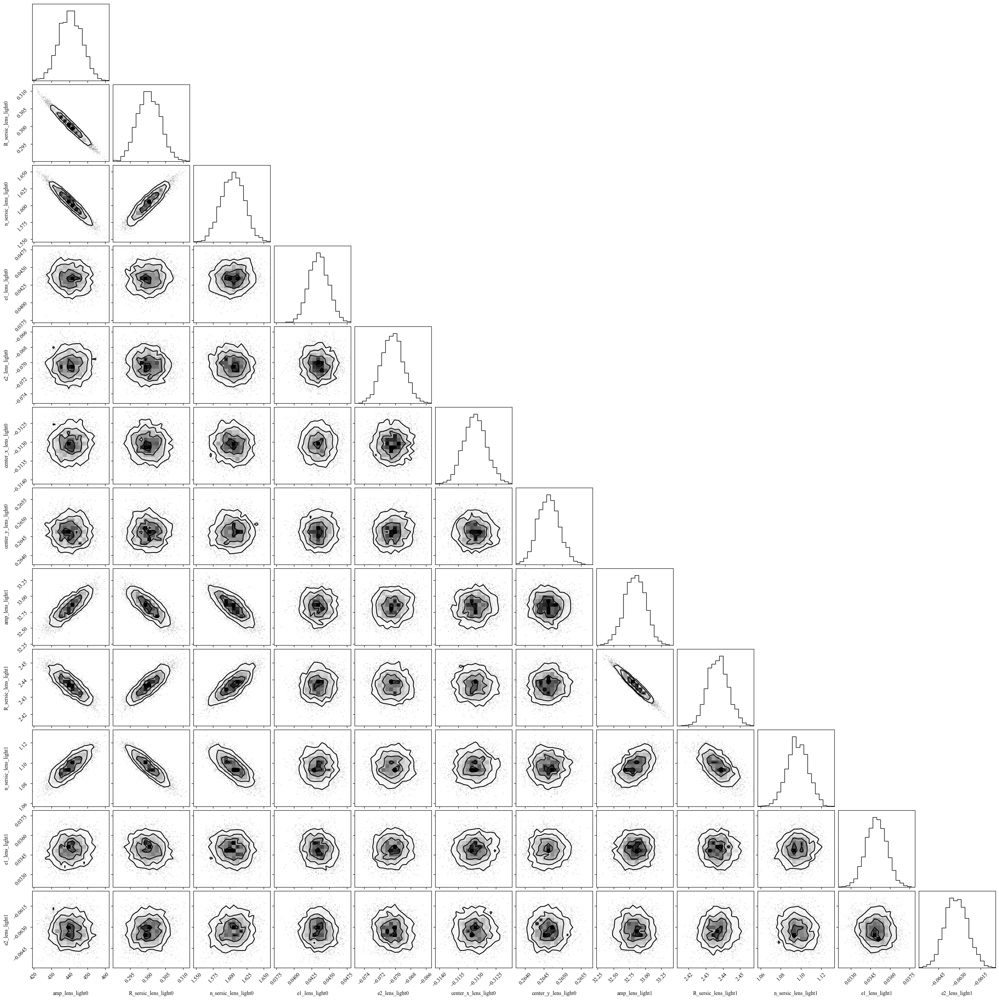

In [75]:
import corner



corner.corner(thinned_chain, labels=param_mcmc);

In [76]:
print('half-light radius: {:.2f}\"'.format(get_half_light_radius(kwargs_result['kwargs_lens_light'])))

half-light radius: 1.91"


In [83]:
from lenstronomy.Util import param_util

phi_1, q_1 = param_util.ellipticity2phi_q(thinned_chain[:, 3],
                                          thinned_chain[:, 4])

phi_1 = 90 - phi_1 * 180 / np.pi

print('Sersic_1 phi: {:.1f}±{:.1f}, q: {:.3f}±{:.3f}'.format(
                            np.mean(phi_1), np.std(phi_1),
                            np.mean(q_1), np.std(q_1)))

phi_2, q_2 = param_util.ellipticity2phi_q(thinned_chain[:, 10],
                                          thinned_chain[:, 11])
phi_2 = 90 - phi_2 * 180 / np.pi

print('Sersic_2 phi: {:.1f}±{:.1f}, q: {:.3f}±{:.3f}'.format(
                            np.mean(phi_2), np.std(phi_2),
                            np.mean(q_2), np.std(q_2)))

Sersic_1 phi: 119.1±0.5, q: 0.847±0.002
Sersic_2 phi: 120.5±0.3, q: 0.865±0.001


In [84]:
selected_chain = np.copy(thinned_chain[:, [0, 1, 2, 3, 4, 7, 8, 9, 10]])

selected_chain[:, 3] = phi_1
selected_chain[:, 4] = q_1

selected_chain[:, 8] = q_2

mean = np.mean(selected_chain, axis=0)
covariance = np.cov(selected_chain.T)

mean, covariance

(array([4.40474442e+02, 3.00299605e-01, 1.60397112e+00, 1.19135121e+02,
        8.47257348e-01, 3.28341603e+01, 2.43706866e+00, 1.09647022e+00,
        8.65239555e-01]),
 array([[ 4.11515860e+01, -2.03208975e-02, -1.03104740e-01,
          1.09693956e-01,  1.48999694e-03,  8.56885752e-01,
         -3.13987606e-02,  5.36186134e-02, -1.17388270e-03],
        [-2.03208975e-02,  1.04182020e-05,  4.96588472e-05,
         -3.55194658e-05, -6.25591932e-07, -4.23764649e-04,
          1.59474533e-05, -2.95492629e-05,  6.36218169e-07],
        [-1.03104740e-01,  4.96588472e-05,  2.86411322e-04,
         -3.62377587e-04, -4.51689429e-06, -2.18435253e-03,
          7.89894920e-05, -1.28496654e-04,  2.92070310e-06],
        [ 1.09693956e-01, -3.55194658e-05, -3.62377587e-04,
          2.31043783e-01,  1.20140352e-05,  1.17187785e-03,
          2.99727402e-06, -4.30712951e-05,  3.22913188e-05],
        [ 1.48999694e-03, -6.25591932e-07, -4.51689429e-06,
          1.20140352e-05,  5.65701798e-06,  3.

## Plot

In [85]:
from matplotlib.collections import LineCollection


def get_all_edges(bool_img):
    """
    Get a list of all edges (where the value changes from True to False) in the 2D boolean image.
    The returned array edges has he dimension (n, 2, 2).
    Edge i connects the pixels edges[i, 0, :] and edges[i, 1, :].
    Note that the indices of a pixel also denote the coordinates of its lower left corner.
    """
    edges = []
    ii, jj = np.nonzero(bool_img)
    for i, j in zip(ii, jj):
        # North
        if j == bool_img.shape[1]-1 or not bool_img[i, j+1]:
            edges.append(np.array([[i, j+1],
                                   [i+1, j+1]]))
        # East
        if i == bool_img.shape[0]-1 or not bool_img[i+1, j]:
            edges.append(np.array([[i+1, j],
                                   [i+1, j+1]]))
        # South
        if j == 0 or not bool_img[i, j-1]:
            edges.append(np.array([[i, j],
                                   [i+1, j]]))
        # West
        if i == 0 or not bool_img[i-1, j]:
            edges.append(np.array([[i, j],
                                   [i, j+1]]))

    if not edges:
        return np.zeros((0, 2, 2))
    else:
        return np.array(edges)


def close_loop_edges(edges):
    """
    Combine thee edges defined by 'get_all_edges' to closed loops around objects.
    If there are multiple disconnected objects a list of closed loops is returned.
    Note that it's expected that all the edges are part of exactly one loop (but not necessarily the same one).
    """

    loop_list = []
    while edges.size != 0:

        loop = [edges[0, 0], edges[0, 1]]  # Start with first edge
        edges = np.delete(edges, 0, axis=0)

        while edges.size != 0:
            # Get next edge (=edge with common node)
            ij = np.nonzero((edges == loop[-1]).all(axis=2))
            if ij[0].size > 0:
                i = ij[0][0]
                j = ij[1][0]
            else:
                loop.append(loop[0])
                # Uncomment to to make the start of the loop invisible when plotting
                # loop.append(loop[1])
                break

            loop.append(edges[i, (j + 1) % 2, :])
            edges = np.delete(edges, i, axis=0)

        loop_list.append(np.array(loop))

    return loop_list


def plot_outlines(bool_img, ax=None, **kwargs):
    if ax is None:
        ax = plt.gca()

    edges = get_all_edges(bool_img=bool_img)
    edges = edges - 0.5  # convert indices to coordinates; TODO adjust according to image extent
    outlines = close_loop_edges(edges=edges)
    cl = LineCollection(outlines, **kwargs)
    ax.add_collection(cl)


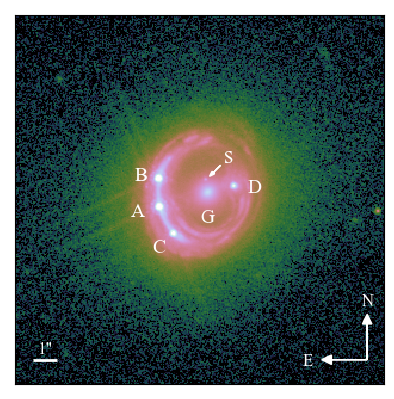

In [135]:
fig = plt.figure()
ax = fig.add_subplot(111)

large_image_copy = np.copy(large_image)
large_image_copy[large_image_copy < 0] = 1e-10

ax.matshow(np.log10(large_image_copy), cmap='cubehelix', 
            vmax=1.5, vmin=-3, origin='lower');

# ax = fig.add_subplot(122)
# ax.matshow(1-(new_mask_4), cmap='Greys', origin='lower')


# plt.figure()
# plt.imshow(array, cmap='binary')
# plot_outlines(new_mask_4.T, lw=1.5, color='y')

array = np.zeros_like(new_mask)
array[match[0]:match[0]+160, match[1]:match[1]+160] = 1
# plot_outlines(array.T, lw=1.5, color=pf.cb_red)


ax.arrow(295, 20, 0, 30,
         head_width=8, head_length=8, fc='white', ec='white', linewidth=1)
ax.arrow(295, 20, -30, 0,
         head_width=8, head_length=8, fc='white', ec='white', linewidth=1)
ax.text(295, 65, "N", color='white', fontsize=12, ha='center')
ax.text(245, 15, "E", color='white', fontsize=12, ha='center')

ax.arrow(15, 20, 20, 0,
         head_width=0, head_length=0, fc='white', ec='white', linewidth=2)
ax.text(25, 25, '1\"', color='white', fontsize=12, ha='center')

ax.set_xticks([])
ax.set_yticks([]);

ax.text(97, 140, 'A', color='white', fontsize=14)
ax.text(100, 170, 'B', color='white', fontsize=14)
ax.text(115, 110, 'C', color='white', fontsize=14)
ax.text(195, 160, 'D', color='white', fontsize=14)

ax.text(155, 135, 'G', color='white', fontsize=14)

ax.text(175, 185, 'S', color='white', fontsize=12)
ax.arrow(172, 183, -6, -6, color='white', head_width=3)


plt.savefig('/Users/ajshajib/Dropbox/Papers_Proposals/rxj1131_kcwi/figures/cutout.pdf', bbox_inches='tight')
# ax.arrow(xx_ * deltaPix, yy_ * deltaPix, (xx_dec - xx_) * deltaPix, (yy_dec - yy_) * deltaPix,
#          head_width=arrow_size * d, head_length=arrow_size * d, fc
#          =color, ec=color, linewidth=1)
# ax.text(xx_dec_t * deltaPix, yy_dec_t * deltaPix, "N", color=color, fontsize=font_size, ha='center')


-1.0162025587782357 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  1.0162025587782357


/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: divide by zero encountered in log10
  log_model = np.log10(model)
/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/ajshajib/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


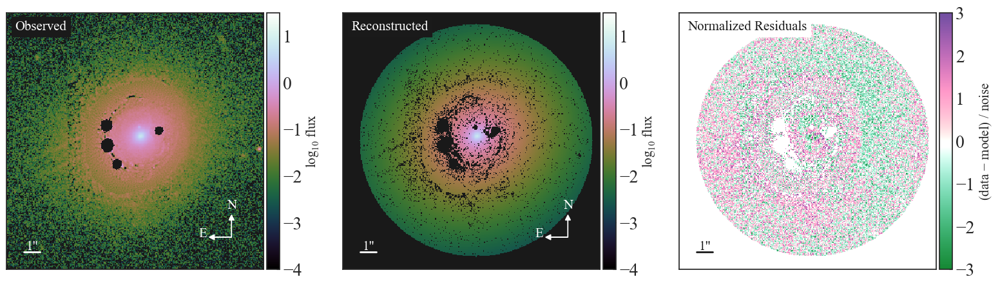

In [136]:
cmap = pf.cmap
pf.set_fontscale(2.5)

lens_plot = ModelPlot(multi_band_list, kwargs_model, kwargs_result_copy,
                      arrow_size=0.02, cmap_string=cmap,
                      image_likelihood_mask_list=[new_mask], #kwargs_likelihood['image_likelihood_mask_list'],
                      multi_band_type='multi-linear', linear_solver=True
                      )


f, axes = plt.subplots(1, 3, figsize=(16, 8), sharex=False, sharey=False)

lens_plot.data_plot(ax=axes[0], band_index=0, cmap=cmap, v_max=1.5, v_min=-4.)

lens_plot.model_plot(ax=axes[1], band_index=0, cmap=cmap, v_max=1.5, v_min=-4., scale=None, noarrow=True)
lens_plot.normalized_residual_plot(ax=axes[2], v_min=-3, v_max=3, cmap=pf.msh_cmap2, colorbar_label=r"(data $-$ model) $/$ noise")
f.tight_layout()

#f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)
# plt.show()

# f, axes = plt.subplots(1, 3, figsize=(16, 8), sharex=False, sharey=False)

# lens_plot.decomposition_plot(ax=axes[0], text='Lens light', lens_light_add=True, unconvolved=True, cmap=cmap, v_max=0.5)
# lens_plot.decomposition_plot(ax=axes[1], text='Lens light convolved', lens_light_add=True, cmap=cmap, v_max=0.5)
# lens_plot.subtract_from_data_plot(ax=axes[2], text='Data - Lens Light', lens_light_add=True, v_max=0.5)


# f.tight_layout()
#f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)
# plt.show()

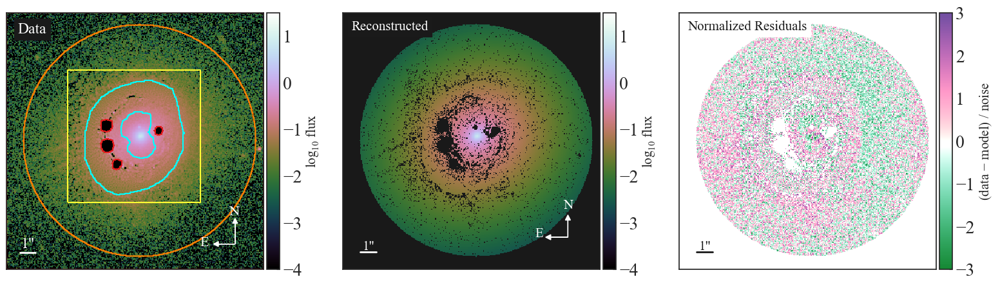

In [137]:
ax = axes[0]
ax.clear()

filled_in_image_copy = np.copy(_image)
filled_in_image_copy[_image <= 0] = 1e-10


ax.matshow(np.log10(filled_in_image_copy), cmap='cubehelix', 
            vmax=1.5, vmin=-4., origin='lower');


# ax = fig.add_subplot(122)
# ax.matshow(1-(new_mask_4), cmap='Greys', origin='lower')


# plt.figure()
# plt.imshow(array, cmap='binary')
# new_mask_7 = np.copy(new_mask)
# new_mask_7 = set_outer_val(new_mask_7, 160, 155, 110, 1)

qso_mask = np.copy(mask)
qso_mask = set_outer_val(qso_mask, 160, 155, 140, 1)

outer_mask = np.copy(mask)
outer_mask = set_inner_val(outer_mask, 160, 155, 140, 1)


plot_outlines(big_mask.T, ax=axes[0], lw=1.5, color='cyan')
plot_outlines(array.T, ax=axes[0], lw=1.5, color='#ffff33')
plot_outlines(qso_mask.T, ax=axes[0], lw=1.5, color=pf.cb_red)
plot_outlines(outer_mask.T, ax=axes[0], lw=1.5, color='#ff7f00')

# array = np.zeros_like(new_mask_4)
# array[match[0]:match[0]+160, match[1]:match[1]+160] = 1
# plot_outlines(array.T, lw=1.5, color='r')


ax.arrow(275, 30, 0, 25,
         head_width=6, head_length=6, fc='white', ec='white', linewidth=1)
ax.arrow(275, 30, -20, 0,
         head_width=6, head_length=6, fc='white', ec='white', linewidth=1)
ax.text(274, 65, "N", color='white', fontsize=16, ha='center')
ax.text(238, 28, "E", color='white', fontsize=16, ha='center')

ax.arrow(15, 20, 20, 0,
         head_width=0, head_length=0, fc='white', ec='white', linewidth=2)
ax.text(25, 25, '1\"', color='white', fontsize=17, ha='center')

ax.text(0.1, 0.92, 'Data', color='white', fontsize=17, ha='center', transform=ax.transAxes, backgroundcolor='k')

ax.set_xticks([])
ax.set_yticks([]);

f.savefig('/Users/ajshajib/Dropbox/Papers_Proposals/rxj1131_kcwi/figures/lens_light_fitting.pdf', 
            bbox_inches='tight'
           )

f